## 1 Author
Student Name: Angelos Tselioudis

Student ID: ec22031

## 2 Problem formulation

In this notebook we are going to be predicting if an audio recording has been recorded indoors or outdoors based on some of the attributes of each recording.

## 3 Machine Learning pipeline

We are feeding the ML model an audio file which will in turn generate 4 audio features:
1)Power.
2)Pitch - mean.
3)Pitch - standard deviation.
4)Fraction of voiced region.

Furthermore, these features will be converted to a Numpy array and will be used in the training of an SVM model predicting whether the audio is indoors or outdoors. 

## 4 Transformation stage

Each audio has countless features. One approach to deal with this huge dimensionality is to extract a few features from our signals and use these features as predictors instead.
Thus, in order to (i) avoid overfitting and (ii) for processing time purposes we need to process and transform our data. We will therefore define a 4 feature long NumPy predictor array consisting of: power, pitch_mean, pitch_std,  voiced_fr to use in our model.

# 5 Modelling

In order to predict whether a recording is indoor or outdoor we are choosing a supervised classification model such as Support Vector Machine. That is because the label that we are trying to predict is discrete and we already know the label of each recording. We could use different models in this section and compare results but since this is the basic version of the exercise we'll keep it simple.

## 6 Methodology

We'll build a support vector machine (SVM) model for the predictive task of identifying the type of filming spot (indoors/outdoors). In order to do so, we will split the dataset defined by X and y into a training set (70%) and a validation set (30%).

Finally, we will assess the model's performance with the Model Accuracy and Validation accuracy measures.



# 7 Dataset

The dataset we will use will contain 500 audio samples. By using more than 500 samples we could improve our model's performance, however, we will use 500 due to limited computing power. 

# Environment set up


Let's start by loading a few useful Python libraries and mounting our personal Google Drive storage system (i.e. making it available, so that Colab can access it).

In [10]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Understanding our dataset sample

Let's unzip the sample data:

In [11]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_1.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)



And now check how many audio files we have:

In [12]:
sample_path = '/content/drive/MyDrive/Data/MLEndLS/sample/*.wav'
files = glob.glob(sample_path)
len(files)

500

This figure (500) corresponds to the number of items or samples in our dataset. Let's listen to some random audio files:

In [13]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

The MLEndLS Dataset is a collection of samples described by 5 attributes:
- Audio
- Area
- Spot
- Whether indoor or outdoor
- Participant

Now uploading the CSV file 'MLEndLS.csv' and loading it into a Pandas DataFrame.


In [14]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [15]:
MLENDLS_df = pd.read_csv('./MLEndLS (2).csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


The audio attribute is a complex one and cannot be directly inserted in a DataFrame structure. Instead, we have the name of the corresponding audio files, e.g. '3086.wav', which in our case are stored in the '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS_Sample/' folder. 

The next cell prints the contents of the folder that stores our sample audio files. We can see that the names of the WAV files correspond to one of the `file_id` entries in the `MLEndLS_df` DataFrame.

In [16]:
for file in files:
  print(file.split('/')[-1])

0001.wav
0003.wav
0002.wav
0006.wav
0005.wav
0007.wav
0010.wav
0008.wav
0009.wav
0004.wav
0011.wav
0012.wav
0014.wav
0013.wav
0015.wav
0019.wav
0021.wav
0018.wav
0017.wav
0016.wav
0020.wav
0022.wav
0024.wav
0025.wav
0023.wav
0027.wav
0026.wav
0028.wav
0029.wav
0031.wav
0030.wav
0032.wav
0033.wav
0034.wav
0035.wav
0036.wav
0038.wav
0037.wav
0040.wav
0039.wav
0042.wav
0041.wav
0043.wav
0044.wav
0046.wav
0045.wav
0048.wav
0047.wav
0051.wav
0050.wav
0049.wav
0052.wav
0054.wav
0053.wav
0055.wav
0058.wav
0056.wav
0057.wav
0059.wav
0060.wav
0061.wav
0062.wav
0063.wav
0064.wav
0065.wav
0066.wav
0067.wav
0069.wav
0070.wav
0068.wav
0071.wav
0072.wav
0073.wav
0075.wav
0074.wav
0076.wav
0077.wav
0078.wav
0079.wav
0081.wav
0082.wav
0080.wav
0083.wav
0085.wav
0084.wav
0086.wav
0089.wav
0087.wav
0090.wav
0088.wav
0092.wav
0091.wav
0093.wav
0094.wav
0095.wav
0096.wav
0097.wav
0098.wav
0099.wav
0100.wav
0101.wav
0102.wav
0103.wav
0108.wav
0106.wav
0105.wav
0107.wav
0104.wav
0111.wav
0109.wav
0110.wav
0

# Feature extraction : Pitch


Let's plot one of our audio signals:

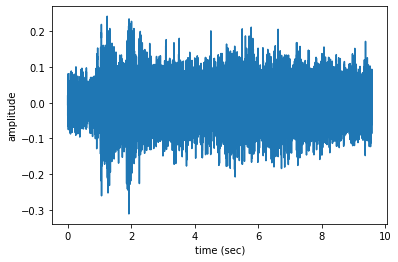

In [17]:
n=0
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

Does it agree with the values shown in the ``` MLENDLS_df ``` dataframe? Let's check it:
 

In [18]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area           british
spot            street
in_out         outdoor
Participant       S151
Name: 0001.wav, dtype: object

Let's start by looking at the number of samples (i.e. time series samples) in one of our audio files:

In [19]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 422919 samples


If we are using a raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. 

One approach to deal with this huge dimensionality is to extract a few features from our signals and use these features as predictors instead. In this notebook we will use four audio features, namely:


1.   Power.
2.   Pitch - mean.
3.   Pitch - standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal.

In [20]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Let's consider the problem of determining whether the filming spot is indoors or outdoors. Then next cell defines a function that takes a collection of audio files together with a CSV file and creates a NumPy array containing the 4 audio features used as predictors (`X`) and a binary label (`y`) that indicates whether the recording is indoors (`y=1`) or outdoors (`y=0`).

In [21]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['in_out']=='indoor'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)


Let's apply `getXy` to the subsample and obtain the NumPy predictor array (`X`) and a binary label (`y`).

In [22]:
X,y = getXy(files, labels_file=MLENDLS_df, scale_audio=False, onlySingleDigit=True)

100%|██████████| 500/500 [12:12<00:00,  1.47s/it]


The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [23]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)


The shape of X is (500, 4)
The shape of y is (500,)
The labels vector is [False False  True False False  True False False False  True False False
 False  True  True  True False False False False False False  True  True
 False False  True False False  True  True  True False  True False False
 False  True False  True False  True False False False False  True False
 False False  True False False  True False  True False False False  True
  True False False  True  True  True False False  True False  True  True
 False False False  True False  True False False False False False False
  True  True False  True False  True False  True  True False False  True
 False  True  True False  True False False  True  True False  True False
 False False False  True False False False False False False  True False
  True  True  True False  True  True  True  True  True  True  True  True
  True False False False  True  True  True  True  True False  True False
 False False  True False  True False False False Fa

We have 500 items consisting of 4 features (stored in `X`) and one binary label (stored in `y`). Is our dataset balanced? Let's have a look:

In [24]:
print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))

 The number of indoor recordings is  210
 The number of outdoor recordings is  290


# Modeling: Support Vector Machines

Let's build a support vector machine (SVM) model for the predictive task of identifying the type of filming spot (indoors/outdoors) using the dataset that we have just created.

We will use the SVM method provided by scikit-learn and will split the dataset defined by X and y into a training set and a validation set.

In [25]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((350, 4), (150, 4), (350,), (150,))



Let's now fit an SVM model and print both the training accuracty and validation accuracy.


In [26]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5942857142857143
Validation  Accuracy 0.56
The support vectors are (303, 4)


We can conclude that the SVM model can accurately predict the correct label with 59% accuracy. Let's normalise the predictors, to see if the performance improves.

In [27]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.7457142857142857
Validation  Accuracy 0.58
The support vectors are (314, 4)


# Conclusion

The model's training accuracy has improved significantly following the normalisation of the predictors. However, validation accuracy has not increased significantly and is less than the training accuracy. Therefore, we can conclude that our model is most likely overfitting. In order to improve this model's performance we could try running the model with a higher number of samples (i.e. 1000) and hence allowing the model to detect more similarities between audio samples. Furthermore, at the moment we are only using 4 features (power, pitch_mean, pitch_std, voiced_fr) for our analysis. By adding more features the model could become more accurate at predicting whether a new recording is indoors or outdoors. Finally, we could also interpret the model in more depth by plotting a confusion matrix which would show us how our model predicts True and False outcomes. 